In [18]:
import pandas as pd
pd.set_option('display.max_columns', 500)
from datetime import datetime
import numpy as np
import timeit
import json
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
from sklearn.metrics import classification_report



In [19]:
# import main 2019 nov dataset csv
outcome_df_all = pd.read_csv('clean_datasets/main_df_2019_nov.csv')

In [20]:
# process main_df for merging - slice with relevant columns for end-of-project metrics
outcome_df_all.rename(columns={'usd_pledged':'final_usd_pledged'}, inplace=True)
outcome_df_all.rename(columns={'backers_count':'final_backers_count'}, inplace=True)

outcome_df = outcome_df_all[['project_id', 'outcome_state', 'final_usd_pledged', 'final_backers_count']]

In [21]:
# import all other datasets - to get midpoint project metrics
df_2019_sep = pd.read_csv('clean_datasets/main_df_2019_sep.csv')
df_2019_july = pd.read_csv('clean_datasets/main_df_2019_july.csv')
df_2019_may = pd.read_csv('clean_datasets/main_df_2019_may.csv')
df_2019_march = pd.read_csv('clean_datasets/main_df_2019_march.csv')
df_2019_jan = pd.read_csv('clean_datasets/main_df_2019_jan.csv')
df_2017_jan = pd.read_csv('clean_datasets/main_df_2017_jan.csv')

In [22]:
# prepare the datasets for merging - select only data that captures projects halfway through(in mid range & live)
df_2019_sep = df_2019_sep[df_2019_sep.outcome_state == 'live']
df_2019_sep = df_2019_sep[df_2019_sep.in_mid_duration_range == True]
df_2019_sep.rename(columns={'outcome_state':'live_state'}, inplace=True)
print(f'df_2019_sep has {len(df_2019_sep)} rows of data')


df_2019_july = df_2019_july[df_2019_july.outcome_state == 'live']
df_2019_july = df_2019_july[df_2019_july.in_mid_duration_range == True]
df_2019_july.rename(columns={'outcome_state':'live_state'}, inplace=True)
print(f'df_2019_july has {len(df_2019_july)} rows of data')


df_2019_may = df_2019_may[df_2019_may.outcome_state == 'live']
df_2019_may = df_2019_may[df_2019_may.in_mid_duration_range == True]
df_2019_may.rename(columns={'outcome_state':'live_state'}, inplace=True)
print(f'df_2019_may has {len(df_2019_may)} rows of data')


df_2019_march = df_2019_march[df_2019_march.outcome_state == 'live']
df_2019_march = df_2019_march[df_2019_march.in_mid_duration_range == True]
df_2019_march.rename(columns={'outcome_state':'live_state'}, inplace=True)
print(f'df_2019_march has {len(df_2019_march)} rows of data')


df_2019_jan = df_2019_jan[df_2019_jan.outcome_state == 'live']
df_2019_jan = df_2019_jan[df_2019_jan.in_mid_duration_range == True]
df_2019_jan.rename(columns={'outcome_state':'live_state'}, inplace=True)
print(f'df_2019_jan has {len(df_2019_jan)} rows of data')


df_2017_jan = df_2017_jan[df_2017_jan.outcome_state == 'live']
df_2017_jan = df_2017_jan[df_2017_jan.in_mid_duration_range == True]
df_2017_jan.rename(columns={'outcome_state':'live_state'}, inplace=True)
print(f'df_2017_jan has {len(df_2017_jan)} rows of data')

df_2019_sep has 1081 rows of data
df_2019_july has 1042 rows of data
df_2019_may has 1265 rows of data
df_2019_march has 1239 rows of data
df_2019_jan has 735 rows of data
df_2017_jan has 777 rows of data


In [23]:
# Create temp dfs to concat later
temp_inner_sep = pd.merge(outcome_df, df_2019_sep, on='project_id', how='inner')
print(f'temp_inner_sep total rows = {temp_inner_sep.shape[0]}')
print(f'temp_inner_sep total columns = {temp_inner_sep.shape[1]}')

temp_inner_july = pd.merge(outcome_df, df_2019_july, on='project_id', how='inner')
print(f'temp_inner_july total rows = {temp_inner_july.shape[0]}')
print(f'temp_inner_july total columns = {temp_inner_july.shape[1]}')

temp_inner_may = pd.merge(outcome_df, df_2019_may, on='project_id', how='inner')
print(f'temp_inner_may total rows = {temp_inner_may.shape[0]}')
print(f'temp_inner_may total columns = {temp_inner_may.shape[1]}')

temp_inner_march = pd.merge(outcome_df, df_2019_march, on='project_id', how='inner')
print(f'temp_inner_march total rows = {temp_inner_march.shape[0]}')
print(f'temp_inner_march total columns = {temp_inner_march.shape[1]}')

temp_inner_jan = pd.merge(outcome_df, df_2019_jan, on='project_id', how='inner')
print(f'temp_inner_jan total rows = {temp_inner_jan.shape[0]}')
print(f'temp_inner_jan total columns = {temp_inner_jan.shape[1]}')

temp_inner_17jan = pd.merge(outcome_df, df_2017_jan, on='project_id', how='inner')
print(f'temp_inner_17jan total rows = {temp_inner_17jan.shape[0]}')
print(f'temp_inner_17jan total columns = {temp_inner_17jan.shape[1]}')
print(f'total rows from all dfs = {temp_inner_sep.shape[0] + temp_inner_july.shape[0]+ temp_inner_may.shape[0]+temp_inner_march.shape[0] + temp_inner_jan.shape[0] + temp_inner_17jan.shape[0]}')
      

temp_inner_sep total rows = 757
temp_inner_sep total columns = 21
temp_inner_july total rows = 761
temp_inner_july total columns = 21
temp_inner_may total rows = 874
temp_inner_may total columns = 21
temp_inner_march total rows = 884
temp_inner_march total columns = 21
temp_inner_jan total rows = 438
temp_inner_jan total columns = 21
temp_inner_17jan total rows = 447
temp_inner_17jan total columns = 21
total rows from all dfs = 4161


In [24]:
temp_dfs_list = [temp_inner_sep, temp_inner_july, temp_inner_may, 
                 temp_inner_march, temp_inner_jan, temp_inner_17jan ]

In [25]:
# conactenate into main 
main_df = pd.concat(temp_dfs_list, axis=0, join='inner',ignore_index=True, verify_integrity=True)

In [26]:
# perform some checks on the final df
print(f'shape : {main_df.shape}')
print(main_df.in_mid_duration_range.value_counts(dropna=False))
print(main_df.live_state.value_counts(dropna=False))
print(f"duplicated : {main_df.duplicated('project_id').sum()}")
print(main_df.outcome_state.value_counts(dropna=False))

shape : (4161, 21)
True    4161
Name: in_mid_duration_range, dtype: int64
live    4161
Name: live_state, dtype: int64
duplicated : 0
successful    2818
failed        1343
Name: outcome_state, dtype: int64


In [27]:
main_df.head(3)

,project_id,outcome_state,final_usd_pledged,final_backers_count,project_name,project_description,live_state,in_mid_duration_range,usd_goal,usd_pledged,currency,launched_at,deadline,staff_pick,country,main_category,duration,days_from_launch,backers_count,project_link,creator_link
0,464921389,successful,5660.0,40,Good Fishermen Know A Lot About Sex,A musical dramedy about family and dealing wit...,live,True,5000.0,1575.0,USD,08-21-2019,10-11-2019,False,US,Theater,50,21,24,https://www.kickstarter.com/projects/213094288...,https://www.kickstarter.com/profile/2130942887
1,932512482,failed,6.0,2,From the Hive Wax Co. - Beeswax Blend Wax Melts,Ever been to Sweet Frog? Imagine this concept ...,live,True,1000.0,6.0,USD,08-16-2019,09-30-2019,False,US,Crafts,45,26,2,https://www.kickstarter.com/projects/fromthehi...,https://www.kickstarter.com/profile/fromthehive
2,953634902,failed,1028.0,4,The Other,"A full-length feature film, based on my 48-Hou...",live,True,25000.0,2.0,USD,08-18-2019,10-02-2019,False,US,Film & Video,45,24,2,https://www.kickstarter.com/projects/the-other...,https://www.kickstarter.com/profile/the-other-...


In [28]:
# add features 
main_df['pledged_to_goal_ratio'] = main_df.usd_pledged / main_df.usd_goal
main_df['description_len'] = main_df.project_description.apply(lambda x: len(x))

In [29]:
# create a deep copy
main_df_copy = main_df.copy(deep=True)

In [30]:
# export cleaned dataframe to csv
main_df.to_csv('models/main_df.csv', index=False )

### EDA and modeling

In [197]:
# Reset main df if needed
# main_df = main_df_copy.copy(deep=True)

In [410]:
main_df.head(1)

,project_id,outcome_state,final_usd_pledged,final_backers_count,project_name,project_description,live_state,in_mid_duration_range,usd_goal,usd_pledged,currency,launched_at,deadline,staff_pick,country,main_category,duration,days_from_launch,backers_count,project_link,creator_link,pledged_to_goal_ratio,description_len
0,464921389,successful,5660.0,40,Good Fishermen Know A Lot About Sex,A musical dramedy about family and dealing with addiction.,live,True,5000.0,1575.0,USD,08-21-2019,10-11-2019,False,US,Theater,50,21,24,https://www.kickstarter.com/projects/2130942887/good-fishermen-know-a-lot-about-sex?re...,https://www.kickstarter.com/profile/2130942887,0.315,58


In [199]:
model_cols = ['usd_goal', 'pledged_to_goal_ratio', 'duration', 'staff_pick',
              'country', 'main_category', 'backers_count', 'description_len', 'outcome_state']

In [200]:
continuous_cols = ['usd_goal', 'duration', 'backers_count', 'pledged_to_goal_ratio', 'description_len']

In [201]:
categorical_cols = ['staff_pick', 'country', 'main_category']

In [202]:
drop_cols = list(set(main_df.columns.to_list()) - set(model_cols))
print(drop_cols)

['creator_link', 'final_backers_count', 'project_name', 'final_usd_pledged', 'live_state', 'launched_at', 'days_from_launch', 'currency', 'project_link', 'project_description', 'project_id', 'deadline', 'usd_pledged', 'in_mid_duration_range']


In [203]:
# create model_df 
model_df = main_df.drop(drop_cols, axis=1)
model_df.head(1)

,outcome_state,usd_goal,staff_pick,country,main_category,duration,backers_count,pledged_to_goal_ratio,description_len
0,successful,5000.0,False,US,Theater,50,24,0.315,58


In [204]:
# encoding binary variables 
model_df['outcome_state'] = model_df['outcome_state'].map({'successful': 1, 'failed': 0})
model_df['staff_pick'] = model_df['staff_pick'].astype(int)
model_df.head(1)

,outcome_state,usd_goal,staff_pick,country,main_category,duration,backers_count,pledged_to_goal_ratio,description_len
0,1,5000.0,0,US,Theater,50,24,0.315,58


In [205]:
# save unique column values lists for categorical variables
uniq_cats = model_df.main_category.unique()
uniq_countries = model_df.country.unique() 

# make dummy tables 
cat_dummy = pd.get_dummies(model_df.main_category, prefix = 'category', drop_first=True)
country_dummy = pd.get_dummies(model_df.country, prefix = 'country', drop_first=True)


In [208]:
model_df_no_dum_cols = model_df.drop(['country', 'main_category'], axis=1)
model_df_with_dummies = pd.concat([model_df_no_dum_cols, cat_dummy, country_dummy], axis=1)
model_df_with_dummies.head(2)

,outcome_state,usd_goal,staff_pick,duration,backers_count,pledged_to_goal_ratio,description_len,category_Comics,category_Crafts,category_Dance,category_Design,category_Fashion,category_Film & Video,category_Food,category_Games,category_Journalism,category_Music,category_Photography,category_Publishing,category_Technology,category_Theater,country_AU,country_BE,country_CA,country_CH,country_DE,country_DK,country_ES,country_FR,country_GB,country_HK,country_IE,country_IT,country_JP,country_LU,country_MX,country_NL,country_NO,country_NZ,country_SE,country_SG,country_US
0,1,5000.0,0,50,24,0.315,58,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,0,1000.0,0,45,2,0.006,117,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [221]:
def make_column_hists(df, fig_columns, select_columns=None, bin_number=10, figure_size=[14,14], max_quantile = 1):
    #if a list of columns is passed use that, otherwise use all df columns
    if select_columns is not None:
        column_list = select_columns
    else:
        column_list = df.columns
    # Set matplotlib style
    plt.style.use('ggplot')
    # get number of rows and columns for the figure grid of plots
    df_cols_len = len(column_list)
    fig_rows = df_cols_len // fig_columns
    if df_cols_len % fig_columns != 0:
        fig_rows += 1
    # create fig and subplots
    fig, ax = plt.subplots(nrows=fig_rows, ncols=fig_columns, figsize=figure_size, dpi=100,sharex=False, sharey=False)
    fig.tight_layout()
    # create a list of subpolot axes
    list_of_axes = []
    if (fig_rows == 1) | (fig_columns == 1):
        for n in range(max([fig_rows, fig_columns])):
            list_of_axes.append(ax[n])
    else:
        for n in range(fig_rows):
            for i in range(fig_columns):
                list_of_axes.append(ax[n,i])
    # plot a histogram on each axes
    for n in range(df_cols_len):
        max_ = df[column_list[n]].quantile(q=max_quantile)
        min_ = df[column_list[n]].min()
        list_of_axes[n].hist(df[column_list[n]],range=[min_, max_], bins=bin_number)
        list_of_axes[n].set_title(f'{column_list[n]}, dtype:{np.dtype(df[column_list[n]]).name}', fontsize=10)
        

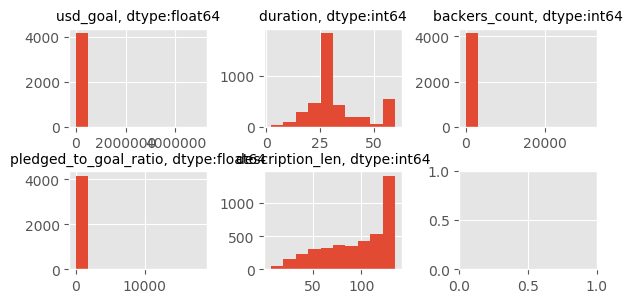

In [345]:
make_column_hists(model_df_with_dummies, 3, select_columns=continuous_cols, figure_size=[6, 3])

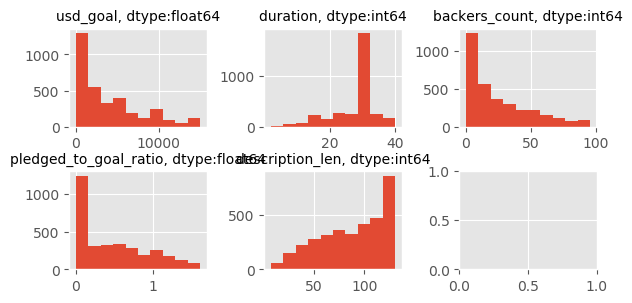

In [346]:
make_column_hists(model_df_with_dummies, 3, select_columns=continuous_cols, figure_size=[6, 3], max_quantile=.8)

In [338]:
scaled_cont = pd.DataFrame(X_cont_scaled, columns = continuous_cols)
scaled_cont.head(3)

,usd_goal,duration,backers_count,pledged_to_goal_ratio,description_len
0,-0.105736,1.322226,-0.149494,-0.026815,-1.118414
1,-0.136624,0.932377,-0.181180,-0.027863,0.596584
2,0.048704,0.932377,-0.181180,-0.027883,-0.537059


In [340]:
minmax_cont = pd.DataFrame(X_cont_minmax, columns = continuous_cols)
minmax_cont.head(3)

,usd_goal,duration,backers_count,pledged_to_goal_ratio,description_len
0,0.0010,0.827586,0.000761,1.739360e-05,0.398438
1,0.0002,0.741379,0.000063,3.313067e-07,0.859375
2,0.0050,0.741379,0.000063,4.417422e-09,0.554688


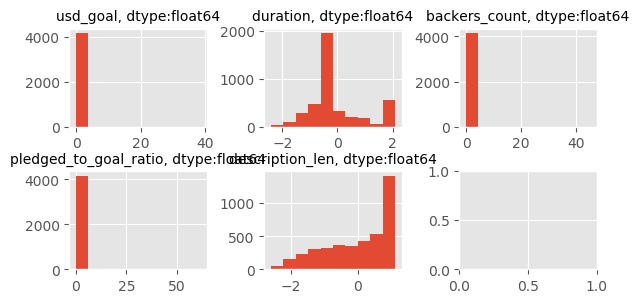

In [348]:
make_column_hists(scaled_cont, 3, select_columns=continuous_cols, figure_size=[6, 3])

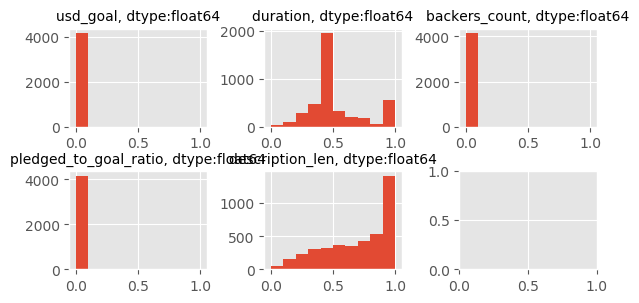

In [342]:
make_column_hists(minmax_cont, 3, select_columns=continuous_cols, figure_size=[6, 3])

In [336]:
X_cont = model_df.loc[:,continuous_cols]
X_cat = model_df.loc[:,categorical_cols]
y = model_df.loc[:, 'outcome_state']

In [350]:
ohe = preprocessing.OneHotEncoder()
ohe.fit(X_cat)
X_cat_ohe = ohe.transform(X_cat).toarray()

scaler = StandardScaler()
X_cont_scaled = scaler.fit_transform(X_cont)

scale = MinMaxScaler()
X_cont_minmax = scale.fit_transform(X_cont)

X_minmax = np.concatenate((X_cont_minmax, X_cat_ohe), axis=1)
X_scaled = np.concatenate((X_cont_scaled, X_cat_ohe), axis=1)
X_reg = np.concatenate((X_cont, X_cat_ohe), axis=1)


In [392]:
X_train_reg, X_test_reg, y_train_r, y_test_r = train_test_split(X_reg, y, test_size =0.2, random_state=35)

In [393]:
X_train_minmax, X_test_minmax, y_train_m, y_test_m = train_test_split(X_minmax, y, test_size =0.2, random_state=10)

In [401]:
X_train_scaled, X_test_scaled, y_train_s, y_test_s = train_test_split(X_scaled, y, test_size =0.2, random_state=30)

In [395]:
tree_classifier_reg = DecisionTreeClassifier()  
tree_classifier_reg.fit(X_train_reg, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [396]:
tree_classifier_minmax = DecisionTreeClassifier()  
tree_classifier_minmax.fit(X_train_minmax, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [402]:
tree_classifier_scaled = DecisionTreeClassifier()  
tree_classifier_scaled.fit(X_train_scaled, y_train)


DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

              precision    recall  f1-score   support

           0       0.89      0.88      0.89       276
           1       0.94      0.95      0.94       557

    accuracy                           0.92       833
   macro avg       0.92      0.91      0.91       833
weighted avg       0.92      0.92      0.92       833



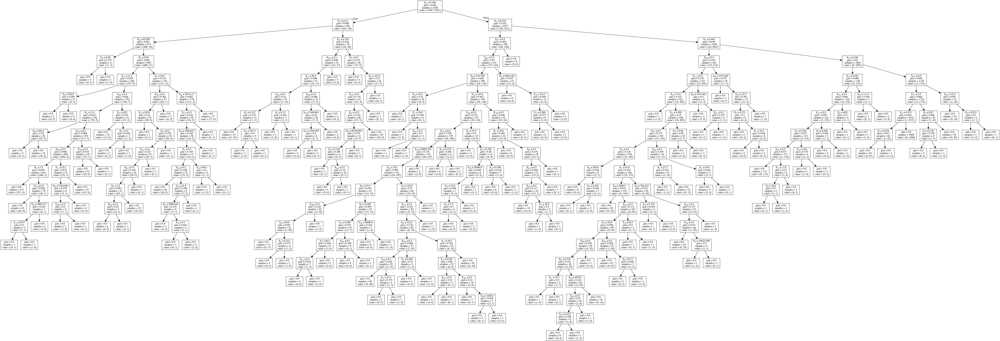

In [398]:
# visualizing the classifier tree
tree_classifier_reg_pred = tree_classifier_reg.predict(X_test_reg)
print(classification_report(y_test_r, tree_classifier_reg_pred))

dot_data = StringIO()
export_graphviz(tree_classifier_reg, out_file=dot_data,  
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [399]:
# visualizing the classifier tree
tree_classifier_minmax_pred = tree_classifier_minmax.predict(X_test_minmax)
print(classification_report(y_test_m, tree_classifier_minmax_pred))


dot_data = StringIO()
export_graphviz(tree_classifier_minmax, out_file=dot_data,  
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

              precision    recall  f1-score   support

           0       0.33      0.34      0.33       271
           1       0.68      0.67      0.67       562

    accuracy                           0.56       833
   macro avg       0.50      0.50      0.50       833
weighted avg       0.56      0.56      0.56       833



In [403]:
# visualizing the classifier tree
tree_classifier_scaled_pred = tree_classifier_scaled.predict(X_test_scaled)
print(classification_report(y_test_s, tree_classifier_scaled_pred))


dot_data = StringIO()
export_graphviz(tree_classifier_scaled, out_file=dot_data,  
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

              precision    recall  f1-score   support

           0       0.39      0.42      0.40       262
           1       0.72      0.70      0.71       571

    accuracy                           0.61       833
   macro avg       0.56      0.56      0.56       833
weighted avg       0.62      0.61      0.61       833



In [404]:
tree_classifier_reg = DecisionTreeClassifier(max_depth=5)  
tree_classifier_reg.fit(X_train_reg, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [405]:
tree_classifier_minmax = DecisionTreeClassifier(max_depth=5)  
tree_classifier_minmax.fit(X_train_minmax, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [406]:
tree_classifier_scaled = DecisionTreeClassifier(max_depth=5)  
tree_classifier_scaled.fit(X_train_scaled, y_train)


DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

              precision    recall  f1-score   support

           0       0.94      0.90      0.92       276
           1       0.95      0.97      0.96       557

    accuracy                           0.95       833
   macro avg       0.95      0.93      0.94       833
weighted avg       0.95      0.95      0.95       833



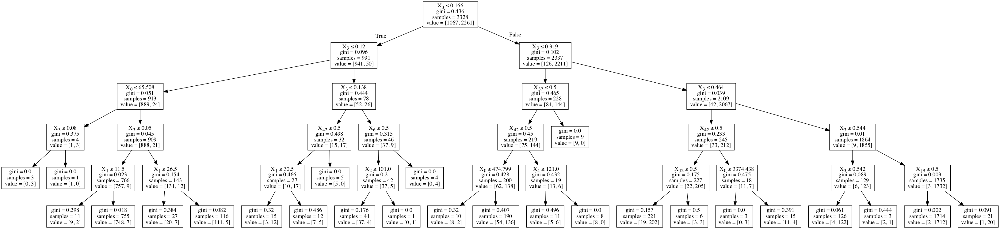

In [407]:
# visualizing the classifier tree
tree_classifier_reg_pred = tree_classifier_reg.predict(X_test_reg)
print(classification_report(y_test_r, tree_classifier_reg_pred))

dot_data = StringIO()
export_graphviz(tree_classifier_reg, out_file=dot_data,  
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       271
           1       0.67      0.99      0.80       562

    accuracy                           0.67       833
   macro avg       0.34      0.49      0.40       833
weighted avg       0.45      0.67      0.54       833



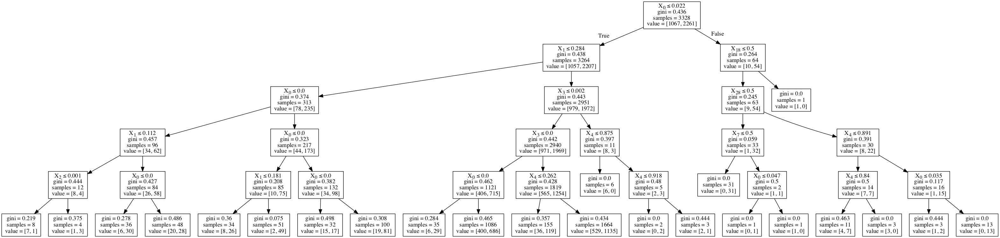

In [408]:
# visualizing the classifier tree
tree_classifier_minmax_pred = tree_classifier_minmax.predict(X_test_minmax)
print(classification_report(y_test_m, tree_classifier_minmax_pred))


dot_data = StringIO()
export_graphviz(tree_classifier_minmax, out_file=dot_data,  
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

              precision    recall  f1-score   support

           0       0.14      0.01      0.01       262
           1       0.68      0.98      0.80       571

    accuracy                           0.67       833
   macro avg       0.41      0.49      0.41       833
weighted avg       0.51      0.67      0.56       833



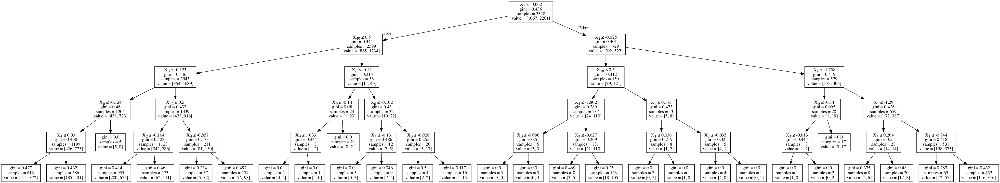

In [409]:
# visualizing the classifier tree
tree_classifier_scaled_pred = tree_classifier_scaled.predict(X_test_scaled)
print(classification_report(y_test_s, tree_classifier_scaled_pred))


dot_data = StringIO()
export_graphviz(tree_classifier_scaled, out_file=dot_data,  
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())